# **1. Introducción**
La criminalidad en el mundo ha sido un tema a tratar desde el inicio de la sociedad. Los estados y países de todo el mundo se han propuesto bajar los índices de delitos, ya que hoy en día es imposible evitar cualquier clase de delito, pero esto no siempre se puede concretar.

Él data set que tenemos a disposición para el análisis representa las características de algunos de los llamados de emergencia registrados, los cuales son meritorios de llamarse delitos, por ende, fueron atendidos por la policía local.

En el siguiente data set tomaremos como labor principal la inspección de los datos recopilados en este data set, el análisis y la detección de problemáticas relacionadas a estos llamados.

Data set: https://www.kaggle.com/datasets/jgiigii/uscrimesdataset

# **2. Análisis Exploratorio de Datos**
En la siguiente sección veremos de manera básica de que se trata los datos recopilados dentro de este data set, esto con el fin de detectar anomalías y problemas, los cuales podemos solucionar eventualmente.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder 
from datetime import datetime

na_values = [' ']#?

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



In [2]:
data = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/Crimes_With_Dates_Cleaned.csv',
                 na_values = na_values)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (2,4,19) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


En primera instancia, veremos la totalidad de filas y columnas, a manera de cuantificar la cantidad de datos que tenemos a disposición de análisis.

In [3]:
rows = len(data.axes[0]) 
cols = len(data.axes[1]) 
  
print("Número de filas: " + str(rows)) 
print("Número de columnass: " + str(cols)) 

Número de filas: 306094
Número de columnass: 36


In [4]:
data.head(3)

,Unnamed: 0,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
0,0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,...,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,8,2018-08,23,False
1,1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True
2,2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True


Se puede observar que existe una columna sin datos ni nombre, por ende se eliminará.

In [5]:
data.drop(labels = ["Unnamed: 0"], inplace = True, axis = 1)

Mostramos las primeras 3 filas de nuestra data set, ya con la columna sin nombre eliminada

In [6]:
data.head(3)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,8,2018-08,23,False
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True


Una vez visualizado el conjunto de datos, de manera resumida, se listarán las columnas de nuestro dataset, incluyendo, también, el tipo de dato que representa

In [7]:
# Tipo de dato de cada columna
data.dtypes

Incident ID                 int64
Offence Code               object
CR Number                   int64
Dispatch Date / Time       object
NIBRS Code                 object
Victims                     int64
Crime Name1                object
Crime Name2                object
Crime Name3                object
Police District Name       object
Block Address              object
City                       object
State                      object
Zip Code                  float64
Agency                     object
Place                      object
Sector                     object
Beat                       object
PRA                        object
Address Number            float64
Street Prefix              object
Street Name                object
Street Suffix              object
Street Type                object
Start_Date_Time            object
End_Date_Time              object
Latitude                  float64
Longitude                 float64
Police District Number     object
Location      

### 2.1 Atributos

Las variables presentes en la colección se clasifican como variables cuantitativas y variables cualitativas incluyendo el detalle de cada una de ellas como se muestra a continuación.

**1.- Variables cuantitativas**

- **Victims:** Representa el número de personas afectadas en el delito.
- **Year:** Año del delito
- **Month:** Mes que se realizó del delito
- **Day:** Día que se realizó el delito.

**2.- Variables Cualitativas**

- **Incident.ID:** Número de registro del incidente.
- **CR.Number:** Registro del delito.
- **Zip.Code:** código de la ciudad donde se realizó el delito.
- **Address.Number:** Número de la calle donde se realizó el delito.
- **Latitude:** Coordenada de latitud de la ubicación del delito
- **Longitude:** Coordenada de longitud de la ubicación del delito
- **Offence.Code:** Código representativo del delito.
- **Dispatch Date Time:** Momento en el que se enviaron a los agentes policiales.
- **NIBRS.Code:** Código que representa el tipo de crimen.
- **Crime.Name1:** Tipo De crimen cometido.
- **Crime.Name2:** Categoría del crimen cometido.
- **Crime.Name3:** Información del crimen cometido.
- **Police.District.Name:** Nombre del distrito donde se cometió el delito.
- **Block.Address:** Dirección donde el crimen fue cometido.
- **City:** Ciudad donde ocurrió el crimen.
- **State:** Estado donde se llevó a cabo el crimen.
- **Agency:** Es la agencia a cargo sobre el tipo de delito.
- **Place:** Lugar donde se llevó a cabo el delito (en la calle, una tienda, una casa, etc.)
- **Sector:** Lugar designado para ciertas patrullas
- **Beat:** Policías designados al sector anterior.
- **PRA:** Número de unidad policial.
- **Street.Prefix:** Indicación de la calle si es Norte, Sur, Este u Oeste.
- **Street.Name:** Nombre de la calle.
- **Street.Suffix:** Indicación de la calle si es Norte, Sur, Este u Oeste.
- **Street.Type:** Indicador de si es AVE (Avenida), BLVD (Boulevard),,CT (callejón) , RD (carretera), ST (calle), entre otras.
- **Start_Date_Time:** Tiempo de inicio del proceso.
- **End_Date_Time:** Tiempo de Finalización del proceso.
- **Police.District.Number:** Número del distrito policial.
- **Location:** Ubicación mediante coordenadas.
- **Year.Month:** Año y mes juntos como fecha.
**Year:** Año y mes juntos como fecha.
**Month:** Año y mes juntos como fecha.
**Year.Month:** Año y mes juntos como fecha.
- **Committed_At_Morning:** Si es de mañana o tarde.

In [8]:
data.head(2)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,8,2018-08,23,False
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True


## 2.2 Limpieza del data set

Para saber si el dataset cumple es viable es necesario saber si posee `missing values`, óseas celdas que no poseen valor. También debemos saber que atributos no cumplen o no aportan valores a nuestro trabajo.

### 2.2.1 Identificación de NaN

> Bloc con sangría



Ahora se listará los atributos junto a la contabilización que presentan de valores nulos o blancos.

In [9]:
data.isnull().sum()

Incident ID                    0
Offence Code                   0
CR Number                      0
Dispatch Date / Time       49029
NIBRS Code                     0
Victims                        0
Crime Name1                  272
Crime Name2                  272
Crime Name3                  272
Police District Name          94
Block Address              26206
City                        1276
State                          0
Zip Code                    3179
Agency                         0
Place                          0
Sector                      1530
Beat                        1530
PRA                          239
Address Number             26109
Street Prefix             292463
Street Name                    1
Street Suffix             300662
Street Type                  339
Start_Date_Time                0
End_Date_Time             161658
Latitude                       0
Longitude                      0
Police District Number         0
Location                       0
Year      

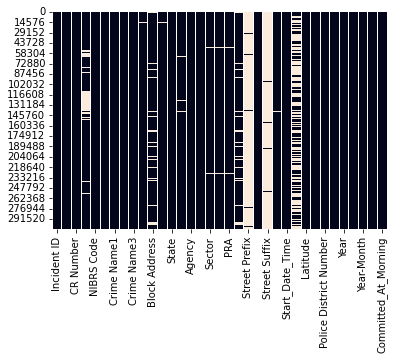

In [10]:
import seaborn as sns

# Identificamos los missing values visualmente
sns.heatmap(data.isnull(), cbar=False)

Se puede observar que variables como `dispach_date_time`, `BlockAdress`, `Street Prefix` y `End_date_time`, por mencionar algunas, presentan gran cantidad datos considerados como N/A o que no han sido registrados, por ejemplo, `Street Suffix` presenta `300662` datos nulos o en blanco de un total de `306094` registros aproximadamente.

Se eliminarán variables de poca relevancia para nuestro análisis, bajo los siguientes criterios:

- `Street Suffix`,`Street Prefix` y `Street Type`: son datos irrelevantes además de contener bastantes datos nulos o en blanco, por ende se considera que el valor que pueden aportar al análisis es de poco interés.
- `Street name`: la información que aporta también a la la variable `Block Adress` y más completa para efectos de nuestro proyecto
-  `Agency`: es información irrelevante, ya que la información aportada con esta variable es la misma que `Police District Name`, pero de forma más escueta
-`Cr Number`: Representa solo un ID del caso, misma información que obtenemos con `Incident ID`
- `Start_Date_Time`y `End_Date_Time`: representa fechas y horas de inicio del caso y fin, ambas variables son poco relevantes, ya que `Dispach_Date_Time` representa de mejor manera la información que necesitamos para abordar nuestra problemática.
- `Latitude`, `Longitude`, `Place` y `PRA`: la dimension espacial se utiliza mejor mediante la variable `Location`.
- `Year-Month`: para representar el mes y el año, se utiliza `month` y `year`

### 2.2.2 Eliminación de Atributos y NA

Basándose en la sección anterior, se procede a eliminar los atributos que no aportan o se encuentran con número grande de valores NA, y también se precede a eliminar los valores NA.

#### 2.2.2.1 Eliminación de atributos

In [11]:
## Eliminación de atributos
data = data.drop(columns=["Incident ID","Offence Code","Agency","CR Number","Street Suffix","Block Address","Address Number","Street Prefix","Start_Date_Time","NIBRS Code","Location","Police District Name","State","Zip Code","End_Date_Time","PRA","Year-Month","Police District Number"])

#### 2.2.2.2 Eliminación de NA

In [12]:
data.dropna(subset=['Crime Name1',"Street Name", "Beat",'Crime Name2','Dispatch Date / Time', 'Crime Name3','City','Sector',"Street Type","Place"], inplace=True)

In [13]:
data.isnull().sum()

Dispatch Date / Time    0
Victims                 0
Crime Name1             0
Crime Name2             0
Crime Name3             0
City                    0
Place                   0
Sector                  0
Beat                    0
Street Name             0
Street Type             0
Latitude                0
Longitude               0
Year                    0
Month                   0
Day                     0
Committed_At_Morning    0
dtype: int64

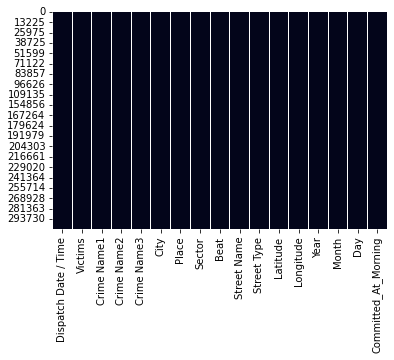

In [14]:
sns.heatmap(data.isnull(), cbar=False)

Realizando una sumatoria de todos los valores NA existentes en el dataset, se puede ver que no existen valores NA. De la misma forma mediante el diagrama es posible ver que no existe presencia de estos valores.

In [15]:
rows = len(data.axes[0]) 
cols = len(data.axes[1]) 
  
print("Número de filas: " + str(rows)) 
print("Número de columnass: " + str(cols)) 

Número de filas: 253852
Número de columnass: 17


Finalmente de poseer `306094` filas y `36` columnas, luego de la limpieza de datos y la agregación de columnas en la **sección 2.1** obtenemos un dataset con `253852` filas y `17` columnas

## Tratamiento de datos

### Fechas

Se realiza un "split" en la variable `Dispach Date Time`, la cual corresponde al momento exacto en la cual se acudió a la emergencia. De esto obtenemos:

- `date_complete`: Momento en el que se enviaron a los agentes policiales en formato datetime.
- `Year`: Año cuando se realizó el delito
- `Month`: Mes cuando se realizó el delito
- `Day`: Dia cuando se realizó el delito
- `Hour`: Hora cuando se realizó el delito
- `DayOfYear`: Dia del año cuando se comete el delito
- `Week`: Número de la semana cuando se comete el delito
- `Quarter`: Cuarto del día cuando se comete el delito
- `DayOfWeek`: Número de la semana cuando se comete el delito
- `month_name`: Nombre del mes cuando se comete el delito
- `day_name`:  Nombre del día cuando se comete el delito


Lo anterior se realiza con el objetivo de poseer variables que ayuden al análisis


In [16]:
data["date_complete"] = [datetime.strptime(data.iloc[i]["Dispatch Date / Time"], '%m/%d/%Y %I:%M:%S %p') for i in range(len(data.index))]
data["date_complete"] = pd.to_datetime(data["Dispatch Date / Time"])
data['Year'] = [(data.iloc[i]['date_complete']).year for i in range(len(data.index))]
data['Month'] = [(data.iloc[i]['date_complete']).month for i in range(len(data.index))]
data['Day'] = [(data.iloc[i]['date_complete']).day for i in range(len(data.index))]
data['Hour'] = [(data.iloc[i]['date_complete']).hour for i in range(len(data.index))]
data['DayOfYear'] = [(data.iloc[i]['date_complete']).dayofyear for i in range(len(data.index))]
data['Week'] = [(data.iloc[i]['date_complete']).week for i in range(len(data.index))]
data['DayOfWeek'] = [(data.iloc[i]['date_complete']).dayofweek for i in range(len(data.index))]
data['Quarter'] = [(data.iloc[i]['date_complete']).quarter for i in range(len(data.index))]
data["month_name"] = data["date_complete"].apply(lambda x: x.month_name())
data["day_name"] = data["date_complete"].apply(lambda x: x.day_name())
data.drop(labels = ["Dispatch Date / Time"], inplace = True, axis = 1)

### Ciudades

In [17]:
data.groupby('City')['Victims'].count().sort_values(ascending=False)

City
SILVER SPRING         88084
GAITHERSBURG          36592
ROCKVILLE             35966
GERMANTOWN            25320
BETHESDA              17992
MONTGOMERY VILLAGE     7825
TAKOMA PARK            5881
CHEVY CHASE            5396
POTOMAC                5372
DERWOOD                4632
KENSINGTON             4106
OLNEY                  3902
BURTONSVILLE           3134
CLARKSBURG             2725
DAMASCUS               2111
BOYDS                  1675
BROOKEVILLE             779
POOLESVILLE             736
SANDY SPRING            343
ASHTON                  300
DICKERSON               253
CABIN JOHN              197
SPENCERVILLE            113
GLEN ECHO                74
BRINKLOW                 61
MOUNT AIRY               58
BARNESVILLE              43
BEALLSVILLE              39
LAUREL                   36
MT AIRY                  19
GARRETT PARK             16
BELTSVILLE               12
HIGHLAND                  9
WASHINGTON GROVE          8
WHEATON                   6
WASHINGTON     

en el siguiente grafico se puede expresar de mejor forma el comportamiento de nuestros datos

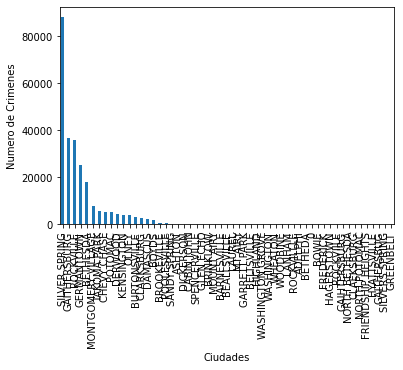

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

data['City'].value_counts().plot(ax=ax, kind='bar', xlabel='Ciudades', ylabel='Numero de Crimenes')

plt.show()

Tenemos en el dataset registro de delitos de 54 ciudades, en donde:

- 16 ciudades registran más de 1000 víctimas
- 7 ciudades entre 100 a 1000 víctimas. 
- 9 ciudades entre 10 y 100 víctimas.
- 23 ciudades con menos de 10 víctimas.




En el se puede observar que claramente exten ciudades como `Silver Spring` tienen una gran repercusion dentro del conjunto de datos, en comparacion con ciudades como `Sandy Spring`

Por lo tanto se decide utilizar las ciudades con más de 300 víctimas por crímenes. El filtrado de ciudades se realiza en la seccion posterior debido a la conveninencia en la obtención de datos.

### Datos metereorologicos

Dado los tipos de datos que se tienen dentro del dataset, se ha decidido como equipo que es necesario buscar otas fuentes de datos para complementar nuestro data set como lo es el caso del siguinete ejemplo del analisis de la ciudad de [Montgomery County](https://www.kaggle.com/code/luluwang0410/montgomery-county-crimes-analysis-2016-2022) 

Creemos que las variables meteorológicas pueden ser utiles para determinar los comportamientos de los delitos en nuestro dataset

En base a la variable `City` se obtienen una serie de variables meteorológicas mediante un script de python utilizando la librería y api de [world weather online](https://www.worldweatheronline.com). Estas variables están asociadas a cada crimen por la ciudad y hora de crimen.

### Obtencion de datos

La obtención de datos meteorológicos se realiza utilizando la librería y api de [world weather online](https://www.worldweatheronline.com). Se obtiene los datos mediante el código postal, estos códigos postales fueron determinados de forma manual debido a que la api rechazaba los nombre por `City`. Una vez obtenido los datos se guardan de forma manual en el repositorio debido a la ciento de miles de solicitudes realizadas en momento de ejecución, de forma que se ahorra el tiempo de compilación de este documento. Debido a lo anterior se comentará la siguiente sección de código y se mantendrá en esta sección en el documento con el fin de acreditar la obtención de datos.

In [19]:
# use package: https://github.com/ekapope/WorldWeatherOnline
#from wwo_hist import retrieve_hist_data
# daily frequency.
#frequency=1
#start_date = '2016-05-01'
#end_date = '2022-09-01'
#api_key = 'SECRET_KEY'
#######SILVERSPRING 20902 - ROCKVILLE 20848 - GAITHERSBURG 20877 - GERMANTOWN 20874 - BETHESDA 20811 - MONTGOMERY VILLAGE 20879 - 
#######CHEVY CHASE 20814 - TAKOMA PARK 20910 -POTOMAC 20827 - KENSINGTON 20895 - BURTONSVILLE 20866 - OLNEY 20830 - DERWOOD 20855 -
#######CLARKSBURG 20876 - # DAMASCUS 20872 - BOYDS 20841 - POOLESVILLE 20837 - BROOKEVILLE 20833 - SANDY SPRING 20860 - ASHTON 20861 -
#######DICKERSON 20842 - CABIN JOHN 20817 -  SPENCERVILLE 20868 - GLEN ECHO 20812

##location_list = ['20902', '20848']
##location_list = ['20877','20874']
##location_list = ['20811',
##location_list = ['20879']
##location_list = ['20814','20910']
##location_list = ['20827']
##location_list = ['20895']
##location_list = ['20866','20830']
##location_list = ['20855','20876']
##location_list = ['20872','20841']
##location_list = ['20837','20833']
#location_list = ['20860'
#location_list ='20861']
#location_list = ['20842','20817']
#location_list = ['20868','20812']
# this one runs for all days from start_date to end_date
# and saves the results as csv to the current directory.

#hist_weather_data = retrieve_hist_data(api_key,
#                                location_list,
#                                start_date,
#                                end_date,
#                                frequency,
#                                location_label = False,
#                                export_csv = True,
#                                store_df = True)

Luego de obtenido y subido al repositorio los datos meteorológicos, se obtienen estos datos de forma individual por cada **Ciudad**. Recordemos que esta ciudad debe tener más de 300 victimas 

In [20]:
SILVERSPRING_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/SILVERSPRING_20902_climate.csv',na_values = na_values)
BETHESDA_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/BETHESDA_20811_climate.csv',na_values = na_values)
CHEVY_CHASE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/CHEVY_CHASE_20814_climate.csv',na_values = na_values)
POTOMAC_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/POTOMAC_20827_climate.csv',na_values = na_values)
BROOKEVILLE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/BROOKEVILLE_20833_climate.csv',na_values = na_values)
POOLESVILLE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/POOLESVILLE_20837_climate.csv',na_values = na_values)
BOYDS_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/BOYDS_20841_climate.csv',na_values = na_values)
ROCKVILLE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/ROCKVILLE_20848_climate.csv',na_values = na_values)
DERWOOD_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/DERWOOD_20855_climate.csv',na_values = na_values)
SANDY_SPRING_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/SANDY_SPRING_20860_climate.csv',na_values = na_values)
BURTONSVILLE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/BURTONSVILLE_20866_climate.csv',na_values = na_values)
DAMASCUS_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/DAMASCUS_20872_climate.csv',na_values = na_values)
GERMANTOWN_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/GERMANTOWN_20874_climate.csv',na_values = na_values)
CLARKSBURG_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/CLARKSBURG_20876_climate.csv',na_values = na_values)
GAITHERSBURG_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/GAITHERSBURG_20877_climate.csv',na_values = na_values)
MONTGOMERY_VILLAGE_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/MONTGOMERY_VILLAGE_20879_climate.csv',na_values = na_values)
KENSINGTON_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/KENSINGTON_20895_climate.csv',na_values = na_values)
TAKOMA_PARK_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/TAKOMA_PARK_20910_climate.csv',na_values = na_values)
OLNEY_climate = pd.read_csv('https://gitlab.com/ricardomillanaob1/datasets/-/raw/master/climate/OLNEY_20830_climate.csv',na_values = na_values)

A modo de comparar los datos meteorológicos se necesita dar un formato especial a la variable `date complete` en el dataframe de  `data` y los datos obtenidos del clima. Esto se realiza mediante la generación de una nueva variable: `comparative_date`, la cual junte la fecha (año-mes-día) y la hora 

In [21]:
#Se realiza un formato comparable por cada hora
data["comparative_date"] = data["date_complete"].dt.strftime("%Y-%m-%d %H")
#Se realiza una trasnformacion del tipo de variable para que pueda ser comparable
data["comparative_date"] = data["comparative_date"].astype('str') 

Ahora se procederá a juntar los datos del clima por cada ciudad mediante la hora en que se realiza un crimen.

In [22]:
#Se aisla la ciudad de forma individual. Se realiza por cada ciudad para evitar la comparación dual de fecha y ubicacion
SILVERSPRING = data[data.City=="SILVER SPRING"]
#Formato de fecha datetime
SILVERSPRING_climate["date_complete"] = [datetime.strptime(SILVERSPRING_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(SILVERSPRING_climate.index))]
#Se realiza un formato comparable por cada hora
SILVERSPRING_climate["comparative_date"] = SILVERSPRING_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
#Se realiza una trasnformacion del tipo de variable para que pueda ser comparable
SILVERSPRING_climate["comparative_date"] = SILVERSPRING_climate["comparative_date"].astype('str') 
# Merge de datos
SILVERSPRING =pd.merge(SILVERSPRING,SILVERSPRING_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

BETHESDA = data[data.City=="BETHESDA"]
BETHESDA_climate["date_complete"] = [datetime.strptime(BETHESDA_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(BETHESDA_climate.index))]
BETHESDA_climate["comparative_date"] = BETHESDA_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
BETHESDA_climate["comparative_date"] = BETHESDA_climate["comparative_date"].astype('str') 
BETHESDA =pd.merge(BETHESDA,BETHESDA_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

CHEVY_CHASE = data[data.City=="CHEVY CHASE"]
CHEVY_CHASE_climate["date_complete"] = [datetime.strptime(CHEVY_CHASE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(CHEVY_CHASE_climate.index))]
CHEVY_CHASE_climate["comparative_date"] = CHEVY_CHASE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
CHEVY_CHASE_climate["comparative_date"] = CHEVY_CHASE_climate["comparative_date"].astype('str') 
CHEVY_CHASE=pd.merge(CHEVY_CHASE,CHEVY_CHASE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

POTOMAC = data[data.City=="POTOMAC"]
POTOMAC_climate["date_complete"] = [datetime.strptime(POTOMAC_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(POTOMAC_climate.index))]
POTOMAC_climate["comparative_date"] = POTOMAC_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
POTOMAC_climate["comparative_date"] = POTOMAC_climate["comparative_date"].astype('str') 
POTOMAC=pd.merge(POTOMAC,POTOMAC_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

BROOKEVILLE = data[data.City=="BROOKEVILLE"]
BROOKEVILLE_climate["date_complete"] = [datetime.strptime(BROOKEVILLE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(BROOKEVILLE_climate.index))]
BROOKEVILLE_climate["comparative_date"] = BROOKEVILLE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
BROOKEVILLE_climate["comparative_date"] = BROOKEVILLE_climate["comparative_date"].astype('str') 
BROOKEVILLE=pd.merge(BROOKEVILLE,BROOKEVILLE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

POOLESVILLE = data[data.City=="POOLESVILLE"]
POOLESVILLE_climate["date_complete"] = [datetime.strptime(POOLESVILLE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(POOLESVILLE_climate.index))]
POOLESVILLE_climate["comparative_date"] = POOLESVILLE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
POOLESVILLE_climate["comparative_date"] = POOLESVILLE_climate["comparative_date"].astype('str') 
POOLESVILLE=pd.merge(POOLESVILLE,POOLESVILLE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

BOYDS = data[data.City=="BOYDS"]
BOYDS_climate["date_complete"] = [datetime.strptime(BOYDS_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(BOYDS_climate.index))]
BOYDS_climate["comparative_date"] = BOYDS_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
BOYDS_climate["comparative_date"] = BOYDS_climate["comparative_date"].astype('str') 
BOYDS=pd.merge(BOYDS,BOYDS_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

ROCKVILLE = data[data.City=="ROCKVILLE"]
ROCKVILLE_climate["date_complete"] = [datetime.strptime(ROCKVILLE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(ROCKVILLE_climate.index))]
ROCKVILLE_climate["comparative_date"] = ROCKVILLE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
ROCKVILLE_climate["comparative_date"] = ROCKVILLE_climate["comparative_date"].astype('str') 
ROCKVILLE=pd.merge(ROCKVILLE,ROCKVILLE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

DERWOOD = data[data.City=="DERWOOD"]
DERWOOD_climate["date_complete"] = [datetime.strptime(DERWOOD_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(DERWOOD_climate.index))]
DERWOOD_climate["comparative_date"] = DERWOOD_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
DERWOOD_climate["comparative_date"] = DERWOOD_climate["comparative_date"].astype('str') 
DERWOOD=pd.merge(DERWOOD,DERWOOD_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

SANDY_SPRING = data[data.City=="SANDY SPRING"]
SANDY_SPRING_climate["date_complete"] = [datetime.strptime(SANDY_SPRING_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(SANDY_SPRING_climate.index))]
SANDY_SPRING_climate["comparative_date"] = SANDY_SPRING_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
SANDY_SPRING_climate["comparative_date"] = SANDY_SPRING_climate["comparative_date"].astype('str') 
SANDY_SPRING=pd.merge(SANDY_SPRING,SANDY_SPRING_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

BURTONSVILLE = data[data.City=="BURTONSVILLE"]
BURTONSVILLE_climate["date_complete"] = [datetime.strptime(BURTONSVILLE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(BURTONSVILLE_climate.index))]
BURTONSVILLE_climate["comparative_date"] = BURTONSVILLE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
BURTONSVILLE_climate["comparative_date"] = BURTONSVILLE_climate["comparative_date"].astype('str') 
BURTONSVILLE=pd.merge(BURTONSVILLE,BURTONSVILLE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

DAMASCUS = data[data.City=="DAMASCUS"]
DAMASCUS_climate["date_complete"] = [datetime.strptime(DAMASCUS_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(DAMASCUS_climate.index))]
DAMASCUS_climate["comparative_date"] = DAMASCUS_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
DAMASCUS_climate["comparative_date"] = DAMASCUS_climate["comparative_date"].astype('str') 
DAMASCUS=pd.merge(DAMASCUS,DAMASCUS_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

GERMANTOWN = data[data.City=="GERMANTOWN"]
GERMANTOWN_climate["date_complete"] = [datetime.strptime(GERMANTOWN_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(GERMANTOWN_climate.index))]
GERMANTOWN_climate["comparative_date"] = GERMANTOWN_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
GERMANTOWN_climate["comparative_date"] = GERMANTOWN_climate["comparative_date"].astype('str') 
GERMANTOWN=pd.merge(GERMANTOWN,GERMANTOWN_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

CLARKSBURG = data[data.City=="CLARKSBURG"]
CLARKSBURG_climate["date_complete"] = [datetime.strptime(CLARKSBURG_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(CLARKSBURG_climate.index))]
CLARKSBURG_climate["comparative_date"] = CLARKSBURG_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
CLARKSBURG_climate["comparative_date"] = CLARKSBURG_climate["comparative_date"].astype('str') 
CLARKSBURG=pd.merge(CLARKSBURG,CLARKSBURG_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

GAITHERSBURG = data[data.City=="GAITHERSBURG"]
GAITHERSBURG_climate["date_complete"] = [datetime.strptime(GAITHERSBURG_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(GAITHERSBURG_climate.index))]
GAITHERSBURG_climate["comparative_date"] = GAITHERSBURG_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
GAITHERSBURG_climate["comparative_date"] = GAITHERSBURG_climate["comparative_date"].astype('str') 
GAITHERSBURG=pd.merge(GAITHERSBURG,GAITHERSBURG_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

MONTGOMERY_VILLAGE = data[data.City=="MONTGOMERY VILLAGE"]
MONTGOMERY_VILLAGE_climate["date_complete"] = [datetime.strptime(MONTGOMERY_VILLAGE_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(MONTGOMERY_VILLAGE_climate.index))]
MONTGOMERY_VILLAGE_climate["comparative_date"] = MONTGOMERY_VILLAGE_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
MONTGOMERY_VILLAGE_climate["comparative_date"] = MONTGOMERY_VILLAGE_climate["comparative_date"].astype('str') 
MONTGOMERY_VILLAGE=pd.merge(MONTGOMERY_VILLAGE,MONTGOMERY_VILLAGE_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

KENSINGTON = data[data.City=="KENSINGTON"]
KENSINGTON_climate["date_complete"] = [datetime.strptime(KENSINGTON_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(KENSINGTON_climate.index))]
KENSINGTON_climate["comparative_date"] = KENSINGTON_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
KENSINGTON_climate["comparative_date"] = KENSINGTON_climate["comparative_date"].astype('str') 
KENSINGTON=pd.merge(KENSINGTON,KENSINGTON_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

TAKOMA_PARK = data[data.City=="TAKOMA PARK"]
TAKOMA_PARK_climate["date_complete"] = [datetime.strptime(TAKOMA_PARK_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(TAKOMA_PARK_climate.index))]
TAKOMA_PARK_climate["comparative_date"] = TAKOMA_PARK_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
TAKOMA_PARK_climate["comparative_date"] = TAKOMA_PARK_climate["comparative_date"].astype('str') 
TAKOMA_PARK=pd.merge(TAKOMA_PARK,TAKOMA_PARK_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

OLNEY = data[data.City=="OLNEY"]
OLNEY_climate["date_complete"] = [datetime.strptime(OLNEY_climate.iloc[i]["date_time"], '%Y-%m-%d %H:%M:%S') for i in range(len(OLNEY_climate.index))]
OLNEY_climate["comparative_date"] = OLNEY_climate["date_complete"].dt.strftime("%Y-%m-%d %H")
OLNEY_climate["comparative_date"] = OLNEY_climate["comparative_date"].astype('str') 
OLNEY=pd.merge(OLNEY,OLNEY_climate[["comparative_date","tempC","windspeedKmph","humidity","precipMM","cloudcover"]],left_on="comparative_date",right_on="comparative_date")

# Se juntan todas las ciudad y forman un nuevo dataset
data = pd.concat([SILVERSPRING,BETHESDA,CHEVY_CHASE,POTOMAC,BROOKEVILLE,POOLESVILLE,BOYDS,ROCKVILLE,DERWOOD,SANDY_SPRING,BURTONSVILLE,DAMASCUS,GERMANTOWN,CLARKSBURG,GAITHERSBURG,MONTGOMERY_VILLAGE,KENSINGTON,TAKOMA_PARK,OLNEY])



## Fechas conmemorativas
Creemos que las fechas conmemorativas o festividades pueden tener alguna incidencia en la ocurrencia de crimenes, es por eso que se establece una nueva variable binaria que indique si el delito ocurrió un día festivo.

In [23]:

data['Is_Commemoration_Day'] =np.where((data['Day']==1) & (data['Month']==1),1,0)# New Years Day
data['Is_Commemoration_Day'] =np.where((data['Day']==16) & (data['Month']==1),1,0)# Marthin Luhter king day
data['Is_Commemoration_Day'] =np.where((data['Day']==17) & (data['Month']==3),1,0)# St. Patrick's Day
data['Is_Commemoration_Day'] =np.where((data['Day']==29) & (data['Month']==5),1,0)# Memorial Day
data['Is_Commemoration_Day'] =np.where((data['Day']==4) & (data['Month']==7),1,0)# Independence Day
data['Is_Commemoration_Day'] =np.where((data['Day']==4) & (data['Month']==9),1,0)# Labor Day
data['Is_Commemoration_Day'] =np.where((data['Day']==10) & (data['Month']==10),1,0)# Veterans Day
data['Is_Commemoration_Day'] =np.where((data['Day']==23) & (data['Month']==11),1,0)# Thanksgiving
data['Is_Commemoration_Day'] =np.where((data['Day']==25) & (data['Month']==12),1,0)# Chtismas
data['Committed_At_Morning'] = np.where(data['Committed_At_Morning'] == True, 1, 0) #Transfomacion a binario 


# Inspeccion luego del tratamiento


# Datos nulos

In [24]:
data.isnull().sum()

Victims                 0
Crime Name1             0
Crime Name2             0
Crime Name3             0
City                    0
Place                   0
Sector                  0
Beat                    0
Street Name             0
Street Type             0
Latitude                0
Longitude               0
Year                    0
Month                   0
Day                     0
Committed_At_Morning    0
date_complete           0
Hour                    0
DayOfYear               0
Week                    0
DayOfWeek               0
Quarter                 0
month_name              0
day_name                0
comparative_date        0
tempC                   0
windspeedKmph           0
humidity                0
precipMM                0
cloudcover              0
Is_Commemoration_Day    0
dtype: int64

# Datos

In [25]:

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 252571 entries, 0 to 3901
Data columns (total 31 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Victims               252571 non-null  int64         
 1   Crime Name1           252571 non-null  object        
 2   Crime Name2           252571 non-null  object        
 3   Crime Name3           252571 non-null  object        
 4   City                  252571 non-null  object        
 5   Place                 252571 non-null  object        
 6   Sector                252571 non-null  object        
 7   Beat                  252571 non-null  object        
 8   Street Name           252571 non-null  object        
 9   Street Type           252571 non-null  object        
 10  Latitude              252571 non-null  float64       
 11  Longitude             252571 non-null  float64       
 12  Year                  252571 non-null  int64         
 13  M

# Análisis de Datos

Dentro de las variables cuantitativas, se ha decidido exponer la relaciones entre esta mediante una matriz de correlacion, de esta forma es posible obtener de manera previa, una idea de como se comportan los datos entre si, esto con los datos adicionados anteriormente

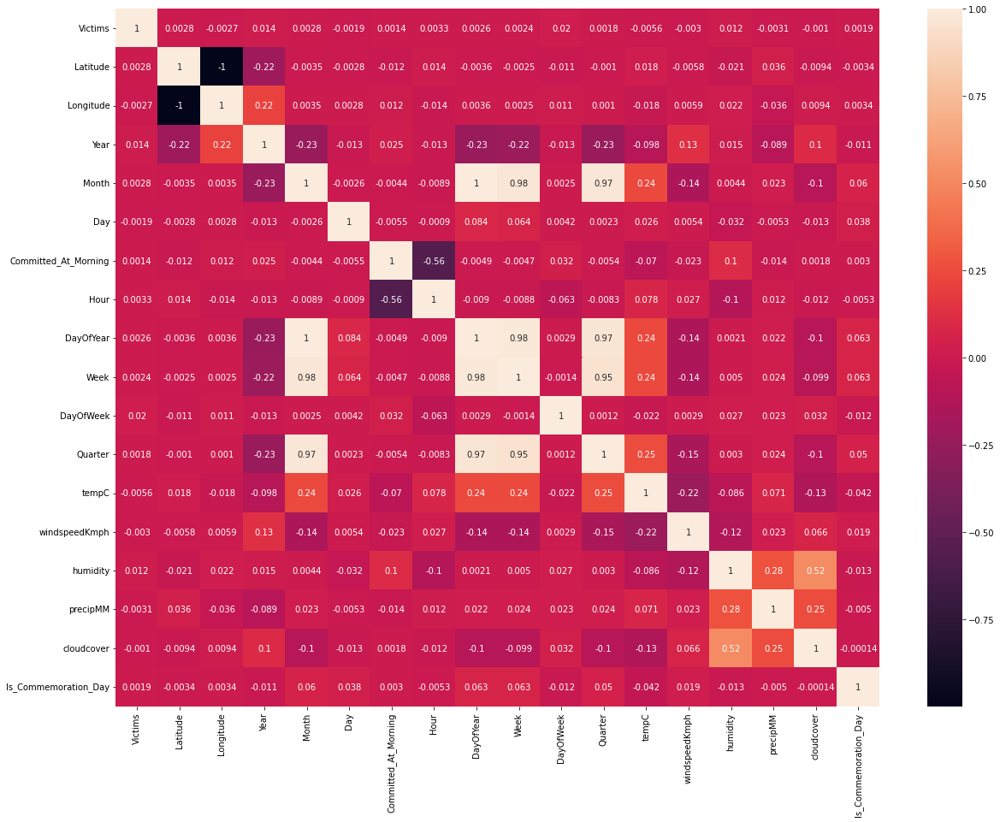

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


corr_df = data.corr(method='pearson')

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df, annot=True)
plt.show()

## 2.3 Exploración y Analisis

Luego de efectuar el análisis exploratorio de los datos, seguimos con la entrega de la información de manera visual, de esta forma lograremos captar de mejor manera la información entregada por el data set.

Para visualizar los cambios efectuados en el tratamiento de fechas y con el fin de ejemplificar la concurrencia de delitos se visualizara a continuacion los crimenes cometidos en cada uno de los meses del año

### 2.3.1 Delitos por mes y año

In [27]:
#Delitos por año y mes
import plotly.express as px
month_order = ["January", "February", "March", "April", "May", 
    "June", "July", "August", "September",
    "October", "November", "December"]
year_order = np.sort(data.Year.unique())
fig = px.histogram(
    data, x = "month_name", barmode = "group",
    color = "Year",
    category_orders = {"Year": year_order, "month": month_order}
)
fig.show()

A partir del año `2017` existe una disminución de los delitos cometidos, sin embargo, el año `2017` y `2022` poseen una diferencia considerable con los demás años.
Los delitos cometidos durante el año `2016` son registrados desde el mes de julio hasta el mes de diciembre, mientras que el año `2022` los delitos son registrados desde el mes de enero hasta una parte del mes de agosto. Debido a lo anterior estos años poseen una diferencia en sus registros respecto a los otros años.

### 2.3.2 Delitos por días

Tambien se visualizara los delitos cometidos en cada uno de los dias de la semana

In [28]:
import plotly.express as px
px.defaults.template = "seaborn"
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
year_order = np.sort(data.Year.unique())
fig = px.histogram(
    data, x = "day_name", 
    category_orders = {"day_name": days_order, "Year": year_order},
    color = "Committed_At_Morning", barmode = "group",
)
fig.show()

En este gráfico se puede observar que el día martes es el día en el cual se reciben más alertas de delitos durante una semana, también es apreciable que los días domingos son los días con menos alertas de delitos registrados en esta muestra, también podemos observar que los delitos son alertados mayormente en el horario de la tarde, con más del doble de alertas, en comparación del horario de la mañana

### 2.3.3 Delitos por hora

Ahora se observará de manera más detallada el anterior gráfico, al visualizar la proporción de las alertas por horas y no por jornadas.

In [29]:
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
d = data
d["Hour"] = d["Hour"].astype(int).astype(str)
fig = px.histogram(
    d, x = "Hour", barmode = "group",
    category_orders = {
        "Year": year_order,
        "Hour": sorted(range(24))                  
                      },
)
fig.add_annotation(
    x = 4, y = 4500,
    arrowcolor = "black", arrowwidth = 2,
    text = "Tendencia baja de crimenes", 
)
fig.show()

La actividad delictual expresada en las horas del día, se puede observar una mayor actividad en el rango de las 15 a 16 horas, y la menor actividad se detecta en el rango horario de las 4 a 5 de la madrugada.

### 2.3.4 Proporcion del Tipo de Crimen

In [30]:
fig = px.pie(
    data.dropna(subset = ["Crime Name1"]), names = "Crime Name1",
    labels={"Crime Name1": "Crime type:"}, 
    title = "Type of crime",
)
fig.update_layout(
    title = dict(
        font_size = 30,
        
    ),
    legend = dict(
        bgcolor="LightSteelBlue",
        font_size = 15
    
    ),
)
fig.show()

El gráfico visualiza de manera eficaz el porcentaje que representa cada uno de los tipos de delitos dentro de la muestra. El mayor porcentaje con un 50.2% de los delitos registrados es en contra de la propiedad, le sigue con un 22.2% de delitos varios, con un 15.7% se acontecen alertas por crímenes contra la sociedad, el 10.7% de las alertas corresponden a crímenes contra la persona y por último, el 1.31% son alertas que no corresponden a ningún crimen en concreto.

### 2.3.5 Cantidad de crimenes a lo largo de los años por categoria

Teniendo la información de las cantidades y comportamientos del registro de alertas delictivas durante horas y días, nos compete definir a que corresponden estas alertas

En este gráfico observamos la cantidad de llamados de emergencia a lo largo de los años, los cuales fueron categorizados dependiendo del tipo de crimen cometido.

In [31]:
data_groupby_year = data.groupby(['Year', 'Crime Name1']).size().unstack().reset_index(inplace=False)

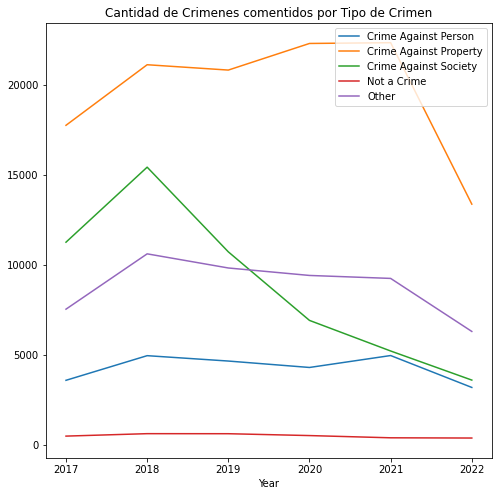

<Figure size 432x288 with 0 Axes>

In [32]:
crimes = ['Crime Against Person', 'Crime Against Property', 'Crime Against Society', 'Not a Crime', 'Other']
data_groupby_year.plot(x='Year', y=crimes, kind="line", figsize=(8, 8))
plt.legend(loc='upper right')
plt.title('Cantidad de Crimenes comentidos por Tipo de Crimen')
plt.show()
plt.clf()

Se observa que la tendencia de las alertas corresponden a los crímenes que atentan contra la propiedad, también se aprecia un declive en las alertas en el último año, esto se puede explicar, ya que el año 2022 aún no termina, por ende los registros se encuentran incompletos

Se pretende ahora definir con mayor detalle la proporción que tiene cada tipo de alerta delictiva dentro del registro de datos

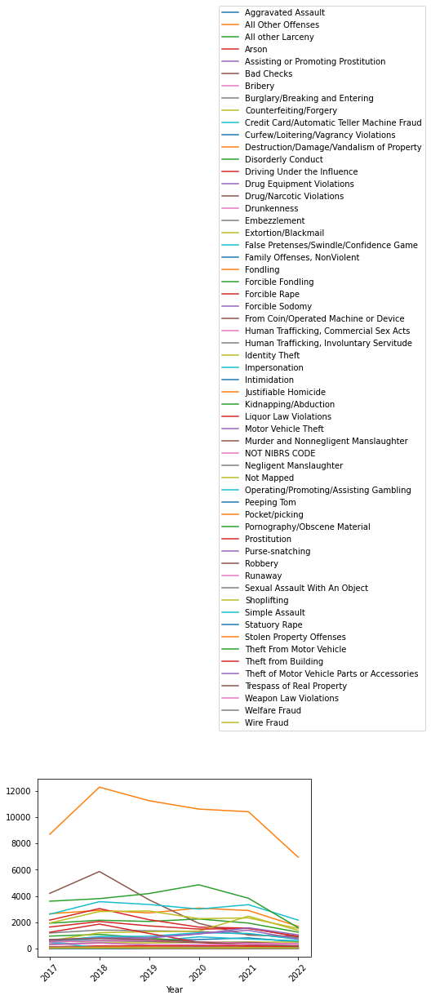

In [33]:
data_group_by_year_crime_2 = data.groupby(['Year', 'Crime Name2'])['Crime Name2'].count()
 
# plot the result
data_group_by_year_crime_2.unstack().plot()
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor = (0.65, 1.25))
plt.show()

Destacamos que existen un tipo de crimen que destaca por sobre el resto el cual tuvo su frecuencia de más alta en el año 2018 y luego empieza una caída sustancial en esa cantidad de crimenes.

### 2.3.6 Proporcion delictualidad en sectores
En el siguiente grafico se muestra la relacion que tiene la cantidad de delitos efectuados con respecto al secto asignado, esto depende netamente de la ubicacion del delito

In [34]:
fig = px.pie(
    data.dropna(subset = ["Sector"]), names = "Sector",
    labels={"Sector": "Sector:"}, 
    title = "Sectores",
)
fig.update_layout(
    title = dict(
        font_size = 30,
        
    ),
    legend = dict(
        bgcolor="LightSteelBlue",
        font_size = 15
    
    ),
)
fig.show()

Este grafico nos muestra que las zonas de conflicto, en proporcion son el sector `P, A y G` sinedo estos los que presentan una diferencia mayor con respecto al resto de sectores

### 2.3.7 Proporcion de delictualidad segun el tipo de calle

In [35]:
fig = px.pie(
    data.dropna(subset = ["Street Type"]), names = "Street Type",
        labels={"Street Type": "Street Type:"}, 
    title = "Street Type",
)
fig.update_layout(
    title = dict(
        font_size = 30,
        
    ),
    legend = dict(
        bgcolor="LightSteelBlue",
        font_size = 15
    
    ),
)
fig.show()

### 2.3.7 Proporcion de delictualidad segun la temperatura ambiental
Con el fin de conciliar una idea con respecto a la razon principal de la delictualidad, ahora se vera un grafico que representa la tasa de delictualidad conforme a la temperatura del dia en el cual se efectuo

In [36]:
d = data
d["tempC"] = d["tempC"].astype(int).astype(str)
fig = px.histogram(
    d, x = "tempC", barmode = "group",
    category_orders = {
        "tempC": sorted(range(40))                  
                      },
)

fig.show()

En el grafico se muestra que en temperaturas extremas como 39,40 y 41 grados celcius, en caso de temperaturas altas y -16, -15 y -14 en las temperaturas bajas, se producen menos delitos que en las temperaturas mas templadas como 24 y 25 grados

## 2.4 Preguntas y Problematicas detectadas

Dada la información obtenida mediante los análisis previos hemos encontrado la siguiente problemática, hemos visto que existen diferencias de la cantidad de delitos cometidos entre día y noche, entre los meses e incluso entre los años, pero nos gustaría saber cómo podemos predecir estos crímenes. Para esto debemos tener en cuenta los siguientes pasos
- 1. Debido a que el delito de robo es el que se produce con una mayor frecuencia, definimos el siguiente problema: ¿Qué variables son las que tienen mayor incidencia en clasificar `Crime Name2` como un delito de robo?. ¿Es posible predecir los delitos de robo en base a esto? 
- 2. Clasificar los delitos de acuerdo a "Crime Name 1"
- 3. Evaluaremos si existen grupos con caracteristicas similares en los delitos para de esta forma agruparlos en una nueva categoria (leve-medio-grave)

Con esto buscamos detectar patrones dentro los delitos y así, de esta forma, tomar medidas con respecto a estos patrones


# Experimento 1

En este experimento se busa responder la pregunta 1: " Debido a que el delito de robo es el que se produce con una mayor frecuencia, definimos el siguiente problema: ¿Qué variables son las que tienen mayor incidencia en clasificar Crime Name 2 como un delito de robo?. ¿Es posible predecir los delitos de robo en base a esto? ".
Durante este experimento se utilizará el clasificador de arbol de desición, debido a que en el Hito 2 otorgó mejores resulados que el clasificador KNN


### Metodología

- Se definen de forma manual los delitos de robo según la columna `Crime Name3.
- Se transforman las variables de tipo String para que puedan ser evaluadas en el modelo.
- Se utiliza la variable Crime Name2 Como Target de nuestro clasificador.
- Para evaluar el modelo se tomará como métrica principal precisión.
- Posteriormente se evaluará el modelo mediante Cross Validation Score.
- Una vez obtenidos los resultados se analizarán las variables con mayor incidencia en la clasificación del delito de robo.
- Finalmente se describirán los resultados obtenidos y se responderá la pregunta 1.


#### Variables a utilizar
- Crime Name2
- Crime Name3
- Year
- Month 
- Day 
- Hour 
- DayOfYear
- Week
- DayOfWeek
- Quarter
- Sector
- Place
- Beat
- Street Name
- Street Type
- Is_Commemoration_Day
- humidity
- precipMM
- cloudcover
- tempC
- windspeedKmph
- Latitude
- Longitude

### Todos los delitos de tipo `Crime Name 3`

In [37]:
types  = data['Crime Name2'].unique()
types

array(['Aggravated Assault', 'Drug/Narcotic Violations',
       'Counterfeiting/Forgery', 'All Other Offenses',
       'Kidnapping/Abduction', 'Driving Under the Influence',
       'Drug Equipment Violations', 'All other Larceny',
       'False Pretenses/Swindle/Confidence Game', 'Weapon Law Violations',
       'Destruction/Damage/Vandalism of Property',
       'Burglary/Breaking and Entering', 'Theft from Building', 'Robbery',
       'Simple Assault', 'Theft From Motor Vehicle', 'Shoplifting',
       'Theft of Motor Vehicle Parts or Accessories',
       'Motor Vehicle Theft',
       'Credit Card/Automatic Teller Machine Fraud', 'Identity Theft',
       'Drunkenness', 'Liquor Law Violations', 'Disorderly Conduct',
       'Trespass of Real Property', 'Forcible Rape', 'Impersonation',
       'Forcible Fondling', 'Runaway', 'Arson', 'Statuory Rape',
       'Extortion/Blackmail', 'Forcible Sodomy', 'Wire Fraud',
       'Family Offenses, NonViolent', 'Pocket/picking',
       'Stolen Propert

Como se ve anteriormente existen varios delitos en la variable `Crime Name3`, los cuales, aunque no sean del tipo *robo* se encuentran almacenado dentro de "*All Other Offence*" en `Crime Name2`. Por esta razon se decide identificar y seleccionar los delitos de tipo robo desde la variable `Crime Name3`. Una vez identificado. Una vez identificados los delitos de tipo robo se almacenan en un dataframe `data_robo` para este experimento.

In [38]:
robo = ["LARCENY - FROM AUTO","ASSAULT - 2ND DEGREE","LARCENY - SHOPLIFTING ","LARCENY (DESCRIBE OFFENSE)","LARCENY - FROM BLDG","LARCENY - AUTO PARTS",
        "AUTO THEFT - VEHICLE THEF","ASSAULT - SIMPLE","BURGLARY - NO FORCED ENTRY-RESIDENTIAL","BURGLARY - FORCED ENTRY-RESIDENTIAL","WEAPON - POSSESSION",
"ASSAULT - AGGRAVATED - NON-FAMILY-OTHER WEAPON","ASSAULT - AGGRAVATED - FAMILY-OTHER WEAPON","ASSAULT - AGGRAVATED - OTHER","LARCENY - POCKET PICKING",
"ROBBERY - STREET-STRONG-ARM","LARCENY - POSTAL","ASSAULT - AGGRAVATED - FAMILY-STRONG-ARM","LARCENY - FROM YARDS","ASSAULT - AGGRAVATED - GUN",
"BURGLARY - NO FORCED ENTRY-NONRESIDENTIAL","BURGLARY (DESCRIBE OFFENSE","ROBBERY - STRONG ARM","LARCENY - PURSE SNATCHING - NO FORCE","LARCENY - FROM MALLS",
"ASSAULT - INTIMIDATION (INCLUDES STALKING)","ROBBERY - GUN","ROBBERY - KNIFE","ROBBERY - STREET-GUN","STOLEN VEHICLE (DESCRIBE OFFENSE)","WEAPON - FIRING",
"ASSAULT - AGGRAVATED - NON-FAMILY-STRONG-ARM","ASSAULT - AGGRAVATED - NON-FAMILY-GUN","ROBBERY - BUSINESS-GUN","FIRE (NOT ARSON)","ROBBERY - DOMESTIC",
"ROBBERY - CARJACKING - ARMED","ARSON - BURNING OF - (IDENTIFY OBJECT)","ROBBERY - BUSINESS-STRONG-ARM","ROBBERY - RESIDENTIAL-GUN","ROBBERY - RESIDENTIAL-STRONG-ARM",
"ROBBERY - STREET-OTHER WEAPON","ROBBERY - BUSINESS-OTHER WEAPON","ROBBERY (DESCRIBE OFFENSE)","ROBBERY - OTHER WEAPON","LARCENY - FROM BANKING-TYPE INST",
"ROBBERY - BANKING-TYPE INST ","ROBBERY - CARJACKING - STRONG-ARM","STOLEN PROPERTY - POSSESS","ASSAULT - AGGRAVATED - POL OFF-OTHER WEAPON","LARCENY - FROM SHIPMENT",
"LARCENY - FROM COIN MACHINE","ASSAULT - AGGRAVATED - PUB OFF-OTHER WEAPON","ROBBERY - RESIDENTIAL-OTHER WEAPON","ROBBERY - FORCIBLE PURSE SNATCHING",
"ASSAULT - AGGRAVATED - POL OFF-STRONG-ARM","AUTO THEFT - THEFT AND USE VEHICLE OTHER CRIME","AUTO THEFT - THEFT AND SALE VEHICLE","LARCENY - THEFT OF US GOVERNMENT PROPERTY",
"AUTO THEFT - STRIP STOLEN VEHICLE","ASSAULT - AGGRAVATED - POL OFF-GUN","STOLEN PROPERTY - RECEIVE","STOLEN PROPERTY (DESCRIBE OFFENSE)"]

#Nueva columna donde se almacenan provisoriamente los valores de "Crime Name3" en formato str
data["crimenes"] = data["Crime Name3"].astype('str')
#Comprobar que los datos de la nueva columna existen en la lista robo
data['Is_Steal'] = [data.iloc[i]['crimenes'] in robo for i in range(len(data.index))]
#Asigna 1 si el delito corresponde a Robo, de lo contario 0
data['Is_Steal'] =np.where((data['Is_Steal']==True),1,0)
#Eliminación de columna provisoria
data.drop(labels = ["crimenes"], inplace = True, axis = 1)
# Datos de tipo robo
data_robo = data[data.Is_Steal==1]


Ahora se transformarán las variables String que se utilizarán para predecir el Target `Crime Name 2`


In [39]:
le = LabelEncoder()
data_robo['Sector'] = le.fit_transform(data_robo['Sector'] ) 
data_robo['Place'] = le.fit_transform(data_robo['Place'])
data_robo['Street Type'] = le.fit_transform(data_robo['Street Type'])
data_robo['Street Name'] = le.fit_transform(data_robo['Street Name'])
data_robo['Beat'] = le.fit_transform(data_robo['Beat'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

### Creación del clasificador


In [40]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import numpy as np
Target='Crime Name2'
Predictors=['Year', 'Month', 'Day', 'Hour', 'DayOfYear','Week','DayOfWeek','Quarter',
            'Sector','Place','Beat','Street Name','Street Type',"Is_Commemoration_Day"
            ,"humidity","precipMM","cloudcover","tempC","windspeedKmph","Latitude","Longitude"]
X=data_robo[Predictors].values
y=data_robo[Target].values

Se define el set de prueba y el de entrenamiento con un 33% de los datos como datos para realizar el testeo de la predicción y que siempre ocupe el mismo *random* para la evaluación del resultado el cual es la semilla 37.


In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33, random_state=37)

Ahora se definen los criterios de `entropy` para el árbol de decisiones y como profundidad máxima del árbol 8 para evitar el sobreajuste del mismo.


In [42]:
#Se define los hiperparametros
clf = DecisionTreeClassifier(max_depth=8,criterion='entropy')
 
#Se crea el modelo de entrenamiento
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

In [43]:
print(classification_report(y_test, y_pred))
#print(confusion_matrix(y_test, y_pred))
print("Accuracy en test set:", accuracy_score(y_test, y_pred))   ## Evaluamos la predicción comparando y_test con y_pred

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



                                             precision    recall  f1-score   support

                         Aggravated Assault       0.12      0.00      0.00      1197
                         All Other Offenses       0.00      0.00      0.00        53
                          All other Larceny       0.56      0.33      0.42      3840
                                      Arson       0.00      0.00      0.00        40
             Burglary/Breaking and Entering       0.54      0.10      0.17      1702
       From Coin/Operated Machine or Device       0.00      0.00      0.00        14
                               Intimidation       0.00      0.00      0.00       103
                        Motor Vehicle Theft       0.00      0.00      0.00        82
                             Pocket/picking       0.25      0.01      0.01       180
                            Purse-snatching       0.00      0.00      0.00       117
                                    Robbery       0.31      0.05

Se puede ver que existe una precisión sobre el 50% en algunos delitos, sin embargo, más de la mitad de los delitos se encuentras debajo del 50% de precisión


In [44]:
from sklearn.model_selection import KFold, cross_val_score

k_folds = KFold(n_splits = 10)

scores = cross_val_score(clf, X, y, cv = k_folds)
print(scores)

[0.4102722  0.47838404 0.49956891 0.53097672 0.5529006  0.48897647
 0.51003818 0.49802907 0.49507268 0.51712244]


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre %41 y como máximo %55

Ahora en este segundo caso con la combinacion de splits de 15


In [45]:
from sklearn.model_selection import KFold, cross_val_score
k_folds = KFold(n_splits = 15)

score = cross_val_score(clf, X, y, cv = k_folds)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))

Cross Validation Scores are [0.40550527 0.45741733 0.47995566 0.48087936 0.53500831 0.53002032
 0.58488823 0.4876201  0.49186992 0.52161863 0.49094605 0.50166297
 0.48484848 0.50831486 0.52697709]
Average Cross Validation score :0.499168838698111


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre %40 y como máximo %58.3


### Atributos con mayor incidencia en clasificar el delito de robo


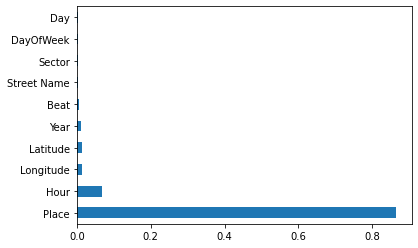

In [46]:
import matplotlib.pyplot as plt
%matplotlib inline 
feature_importances = pd.Series(clf.feature_importances_, index=Predictors) 
feature_importances.nlargest(10).plot(kind='barh')

# Resultados
Las siete variables con mayor incidencias son (ordenadas de mayor a menor incidencia):
- 1. Place
- 2. Hour
- 3. Longitude
- 4. Latitude
- 5. Year
- 6. Beat
- 7. Street Name

`Place` es una variable que nos indica el lugar donde se cometió el delito. Siendo el delito de tipo robo y siendo las variables `Place`, `Hour`, `Longitude` y `Latitude` con mayor incidencia, logramos establecer que el delito de tipo depende de la hora y el lugar para que pueda ser cometido.

Mediante el clasificador de `Árbol de decisiones` fué posible obtener una precisión sobre el 50% en ciertos delitos como: *Weapon Law Violations*, *Theft From Motor Vehicle*, *Burglary/Breaking and Entering* y *All other Larceny*. Sin embargo, otros delitos de tipo robo proseen una precisión menor al 50%. Estamos aplicando este modelo sin la utilización de técnicas que ayuden el desbalanceo de clases, por tanto, en esta instancia creemos que no es posible predecir los delitos de tipo robo.



#Experimento 2



### Meotodologia
El siguiente experimento es un problema de clasificacion para categorizar los crimenes de acuedo a la columna "Crime Name 1"
Para este experimento se utilizara;
1. Arbol de decisión
2. KNN

### Arbol de decisión
Se define la variable `target` y las columnas usadas para la predicción.
 
El siguiente caso nuestro target serán los `Crime Name1` ya que buscamos predecir esta columna en este método experimental.
 
Mientras que las variables utilizadas para predecir la columna `Crime Name1` son las mencionadas en el Modelo Propuesto.


In [47]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import numpy as np

In [48]:
TargetVariable='Crime Name1'

Predictors=['Victims', 'Year', 'Month', 'Hour', 'Day', 'Committed_At_Morning','Is_Commemoration_Day',"humidity","precipMM","cloudcover"]
X=data[Predictors].values
y=data[TargetVariable].values

Se define el set de prueba y el de entrenamiento con un 33% de los datos como datos para realizar el testeo de la predicción y que siempre ocupe el mismo *random* para la evaluación del resultado el cual es la semilla 37.

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33, random_state=37)

Ahora se definen los criterios de `entropy` para el árbol de decisiones y como profundidad máxima del árbol 3 para evitar el sobreajuste del mismo.

In [50]:
#Se define los hiperparametros
clf = DecisionTreeClassifier(max_depth=3,criterion='entropy')
 
#Se crea el modelo de entrenamiento
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

In [51]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print("Accuracy en test set:", accuracy_score(y_test, y_pred))   ## Evaluamos la predicción comparando y_test con y_pred

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



                        precision    recall  f1-score   support

  Crime Against Person       0.91      0.17      0.29      8489
Crime Against Property       0.55      0.85      0.67     38690
 Crime Against Society       0.43      0.52      0.47     17653
           Not a Crime       0.00      0.00      0.00       997
                 Other       0.00      0.00      0.00     17520

              accuracy                           0.52     83349
             macro avg       0.38      0.31      0.28     83349
          weighted avg       0.44      0.52      0.44     83349

[[ 1457  4787  2245     0     0]
 [    0 32986  5704     0     0]
 [    0  8547  9106     0     0]
 [    0   650   347     0     0]
 [  136 13399  3985     0     0]]
Accuracy en test set: 0.5224897719228785


Se observa una precisión bastante alta en Crime Against Person, pero no se puede tener certeza de que estos valores nos permitan realmente predecir correctamente todo los crimenes ya que existen 2 categorías en un 0% de predicción por los datos.

En el caso de la matriz de confusión observamos que el que tiene más aciertos es Crime

### Evaluacion del modelo Arbol de desicion

Para medir el desempeño del modelo utilizaremos `cross validation`, en este primer caso con la combinación de splits de 10

In [52]:
from sklearn.model_selection import KFold, cross_val_score

k_folds = KFold(n_splits = 10)

scores = cross_val_score(clf, X, y, cv = k_folds)
print(scores)

[0.47022725 0.38947618 0.63396286 0.59227145 0.58767866 0.47650156
 0.46236687 0.56614008 0.46347547 0.52591361]


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre 38% y como máximo 63%

Ahora en este segundo caso con la combinacion de splits de 15

In [53]:
k_folds = KFold(n_splits = 15)

score = cross_val_score(clf, X, y, cv = k_folds)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))

Cross Validation Scores are [0.49694162 0.40188859 0.39173298 0.62875638 0.65649127 0.53616819
 0.62008552 0.4221404  0.56384369 0.53112009 0.45504217 0.5603991
 0.38555648 0.5823732  0.54543295]
Average Cross Validation score :0.5185315083278949


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre 36% y como máximo 63%

### KNN
Creamos nuestro X e y de entrada y los sets de entrenamiento y test a partir de los atributos que utilicemos.

In [54]:
# knn
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

X = data[['Victims', 'Year', 'Month', 'Hour', 'Day', 'Committed_At_Morning','Is_Commemoration_Day',"humidity","precipMM","cloudcover"]].values
y = data['Crime Name1'].values

Entrenamiento del dataset a partir del target y la data

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=20)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Creacion del clasificador knn, a partir de los features de prueba

In [56]:
knn = KNeighborsClassifier(10)
knn.fit(X_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

Accuracy of K-NN classifier on training set: 0.57
Accuracy of K-NN classifier on test set: 0.49


In [57]:
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[  395  4004  1425     1   613]
 [  662 23357  3191     2  2224]
 [  413  6009  5912     1   930]
 [   24   492   161     0    53]
 [  469  9031  2198     0  1576]]
                        precision    recall  f1-score   support

  Crime Against Person       0.20      0.06      0.09      6438
Crime Against Property       0.54      0.79      0.65     29436
 Crime Against Society       0.46      0.45      0.45     13265
           Not a Crime       0.00      0.00      0.00       730
                 Other       0.29      0.12      0.17     13274

              accuracy                           0.49     63143
             macro avg       0.30      0.28      0.27     63143
          weighted avg       0.43      0.49      0.44     63143



### Evaluacion de desempeño del modelo KNN
Para medir el desempeño del modelos **utilizaremos cross validation, ya que nos permitira testear el modelo a partir de la cantidad de segmetaciones que utilicemos**

In [58]:
from sklearn.model_selection import KFold, cross_val_score

k_folds = KFold(n_splits = 10)

scores = cross_val_score(knn, X, y, cv = k_folds)
print(scores)

[0.44433447 0.35954389 0.51233321 0.53007087 0.55647939 0.43093004
 0.42712911 0.47768935 0.43223661 0.47891674]


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores como minimo son de 35% y como máximo un 53%

### Resultados
Si bien se logró compara los resultados de la clasificación entre `Árbol de decisiones` y `KNN` se observa un mejor resultado en el método de `Árbol de decisiones`, pero no son concluyentes a responder las problemáticas ya que sus valores no son muy representativos en cuanto a todos los resultados posibles en el problema. Ademas podemos concluir que nuestro dataset no posee datos equilibrados en cuanto al atributo que queremos predecir y tambien en posible que se necesite aplicar otras tecnicas mas avanzadas para obtener resultados mas alentadores.


#  **Experimento 3**


### Metodologia
El siguiente experimento es un problema de segmentacion o agrupacion de los llamados de emergencia del dataset, para categorizar los crimenes de acuerdo si son; leves, medios, graves;
Para este experimento se utilizara;
1. Clustering

El algoritmo que utilizaremos es:
1. K-means

### K-Means

In [59]:
from sklearn.cluster import KMeans

Con el dataset ya limpio podemos utilizarlo para entrenar al algortimo y encontrar el resultado mas optimo.
Para este modelo utilizaremos las columnas:
- Victims
- Year
- Month
- Hour
- Day
- Committed_At_Morning
- Is_Commemoration_Day
- humidity
- precipMM
- cloudcover
- Street Type

In [60]:
X = data[['Victims', 'Year', 'Month', 'Hour', 'Day', 'Committed_At_Morning','Is_Commemoration_Day',"humidity","precipMM","cloudcover"]]

 Ejecutemos K-Means entre 1 y 24 clusters

In [61]:
random_state = 20

sse = []

clusters = list(range(1, 24))
for k in clusters:
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(X)
    sse.append(kmeans.inertia_)

Se realiza la implementación del método del codo, para poder apreciar la cantidad mas correcta
con la que trabajar.

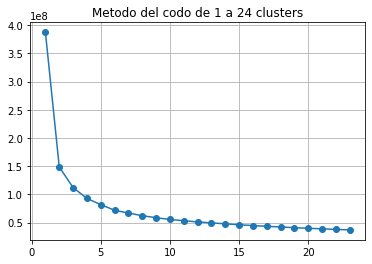

In [62]:
plt.plot(clusters, sse, marker="o")
plt.title("Metodo del codo de 1 a 24 clusters")
plt.grid(True)
plt.show()

El gráfico nos muestra el error de K-Means usando diferentes números de clusters. Acá se puede notar que un valor óptimo es 3

Con el valor ya encontrado podemos entrenar de mejor manera el modelo con K-Means

In [63]:
kmeans = KMeans(n_clusters=3, n_init=20, max_iter=300, random_state=random_state).fit(X)
y_pred = kmeans.predict(X)
y_pred

array([1, 1, 1, ..., 1, 2, 0], dtype=int32)

Con la funcion bicount podemos encontrar la cantidad de datos que posee cada cluster

In [64]:
from collections import Counter
Counter(kmeans.labels_)

Counter({1: 125011, 0: 61556, 2: 66004})

Ahora graficamos para apreciar el enfoque visual de los posibles clusters generados.

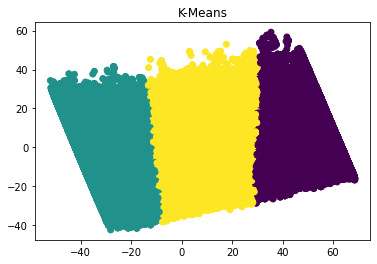

In [65]:
from sklearn.decomposition import PCA
new_X = PCA(n_components=2, random_state=0).fit_transform(X)

plt.scatter(new_X[:, 0], new_X[:, 1], c=kmeans.labels_)
plt.title("K-Means")
plt.show()

### Evaluacion del model K-Means

In [ ]:
from sklearn.metrics import silhouette_score

print("Dataset X K-Means\t", silhouette_score(X, kmeans.labels_))

### Resultados

Fue posible obtener un optimo resultado al agrupar los direntes delitos?

Dado el experimento realizado con la tecnica de clustering, en primera instancia la hipotesis inicial daba 3 variables iniciales que podian representar grupos con caracteristicas similares para establecer la gravedad de un llamado de emergencia, bajo esta premisa el metodo del codo nos arrojo la el resultado esperado 


# 5. Trabajo realizado
- **Diego Garrido:** Redacción, estructuración del proyecto, creación de introducción, desarrollo y analisis de graficos de delitos por meses, horas, comparativa de delitos mañana-tarde y proporcion de delictualidad segun temperatura ambiental, desarrollo de matriz de coorelacion, desarrollo y redaccion de preguntas, desarrollo de tratamiento de datos (Split fechas), redaccion de resumen, introduccion, y metologia del paper y estructuracion y desarrllo de slides de la presentacion (de la n hasta la n)

- **Nicolas Pereira:** Redacción, creacion de graficos sesccion 2.3 de tipos de Crimenes y ciudades con más crimenes, analisis, desarollo de la propuesta para experimentos 2 y 3 y creacion de los metodos de clasificación para los experimentos 2 y 3 y redaccion del informe.

- **Ricardo Millanao:** Código y redacción de la sección 2.2, código y análisis de la sección 2.3.2 y 2.3.2. Orden de secciones. Redacción de Resumen en PDF (Slide 0 a 8).

In [ ]:
#%%shell
#jupyter nbconvert --to html /content/file.ipynb